# Assignment 3 : K-Means Clustering & Random Forest for Image Classification

## **Motivation**
In real-world applications, images contain rich information, but using raw pixel values directly for classification can be inefficient. Feature extraction helps capture meaningful patterns that improve model performance. 

In this assignment, you will:
- Use **K-Means clustering** to extract key features from grayscale images.
- Train a **Random Forest classifier** on the extracted features.
- Experiment with different clustering algorithms (**DBSCAN, GMM**) and hyperparameters.
- Evaluate how hyperparameter tuning affects classification accuracy.
- **Visualize segmentation results** to understand how clustering impacts feature extraction.

This hands-on approach will enhance your understanding of **unsupervised learning**, **feature engineering**, and **classification techniques** 

---



## Part 1: K-Means Feature Extraction (15 points)

### Extract Features from Images

In this task, you will apply K-Means clustering to grayscale images to extract meaningful features.

### Steps:

1. **Flatten the Image**  
   - Reshape the image from `(height, width)` to `(height * width,)`.

2. **Apply K-Means Clustering**  
   - Use K-Means to group pixels into `n_clusters` (e.g., `n_clusters=3`).

3. **Extract Features from Clustering Results**  
   - **Anomaly Ratio**: The proportion of pixels belonging to very small clusters.  
   - **Cluster Ratios**: The fraction of pixels assigned to each cluster.  
   - **Mean Intensities**: The average intensity of pixels within each cluster.

---

## Part 2: Train a Random Forest Classifier (10 points)

- Train a **Random Forest classifier** using the extracted features from Part 1.

---

## Part 3: Evaluate the Classifier (10 points)

- **Evaluate the model’s performance** using:
  - **Accuracy Score**
  - **Classification Report** (Precision, Recall, F1-score for each class)

---

## Part 4: Experiment with Hyperparameters and Report Improvements (15 points)

### **Step 1: Clustering Algorithm Comparison (5 points)**
- **Modify `n_clusters` in K-Means** and observe changes in accuracy.
- **Implement DBSCAN and GMM** (Gaussian Mixture Model) clustering instead of K-Means.
- **Compare accuracy and performance** of all three clustering methods.

### **Step 2: Random Forest Estimators (5 points)**
- **Increase `n_estimators` from 100 to 200** in the Random Forest model.
- **Report changes in accuracy** and analyze if the model improves.

### **Step 3: Anomaly Threshold (5 points)**
- **Modify `anomaly_ratio_threshold` from 0.01 to 0.05**.
- **Explain how it affects** the anomaly ratio and classification accuracy.

---

## Part 5: Visualizing Segmentation for Various Clustering Algorithms and Hyperparameters (10 points)

- Generate and display segmentation results for different clustering methods (`K-Means`, `DBSCAN`, `GMM`).
- Visualize how different **`n_clusters` values, anomaly thresholds, and hyperparameters** impact segmentation results.


sample output
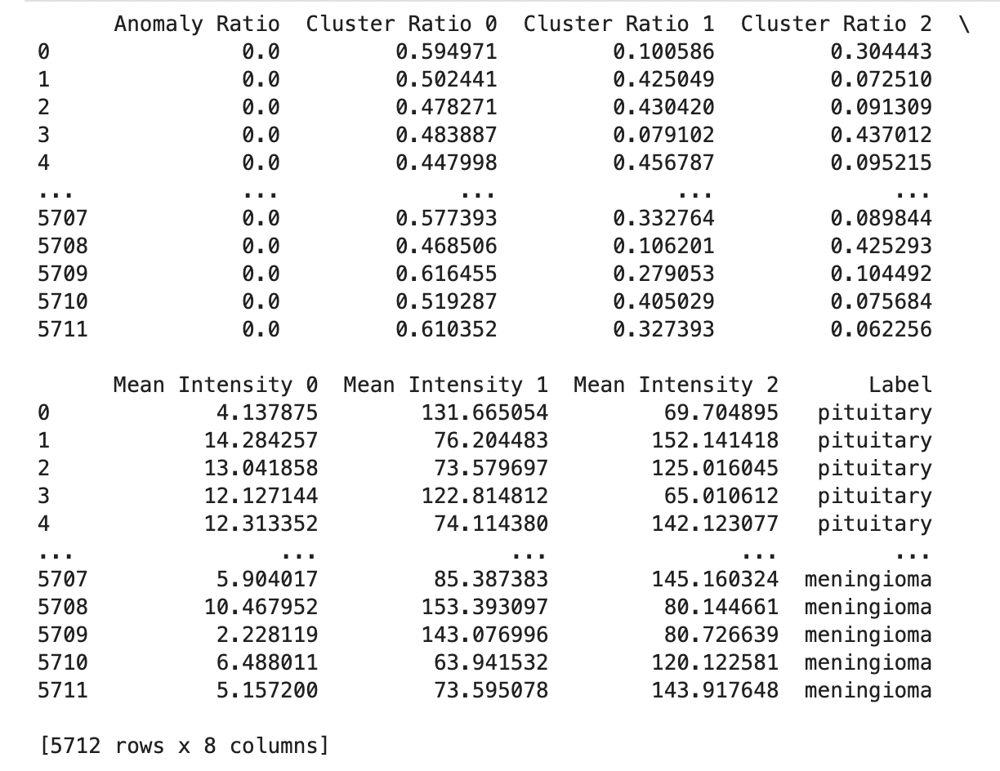

# Part 3: Evaluate the Classifier (10 points):
#     Evaluate performance using accuracy score and classification report.
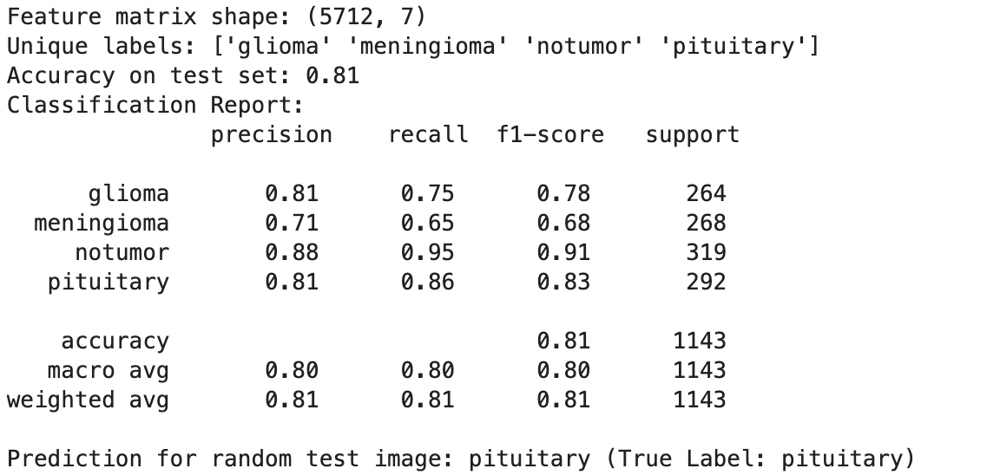

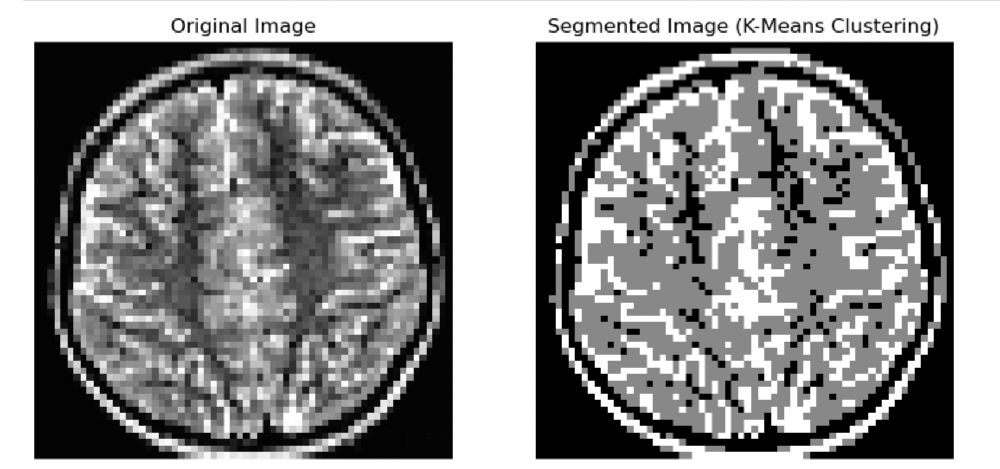

# Part 1: K means Feature Extraction

In [2]:
import os
import numpy as np
import cv2 
from sklearn.cluster import KMeans

In [3]:
train_path = "Training"
test_path = "Testing"
categories = ["glioma", "meningioma", "notumor", "pituitary"]

In [4]:
def load_images_and_labels(folder_path, categories, img_size=(64, 64)):
    images = []
    labels = []
    for label, category in enumerate(categories):
        category_path = os.path.join(folder_path, category)
        if not os.path.exists(category_path):
            print(f"Warning: {category_path} does not exist. Skipping.")
            continue
        for img_name in os.listdir(category_path):
            img_path = os.path.join(category_path, img_name)
            img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
            
            if img is None: 
                print(f"Failed to load {img_path}. Skipping.")
                continue
            
            img = cv2.resize(img, img_size)
            images.append(img)
            labels.append(label)
    return np.array(images), np.array(labels)

In [5]:
train_images, train_labels = load_images_and_labels(train_path, categories)
test_images, test_labels = load_images_and_labels(test_path, categories)

In [6]:
print(f"Training images shape: {train_images.shape}")
print(f"Training labels shape: {train_labels.shape}")
print(f"Testing images shape: {test_images.shape}")
print(f"Testing labels shape: {test_labels.shape}")

Training images shape: (5712, 64, 64)
Training labels shape: (5712,)
Testing images shape: (1311, 64, 64)
Testing labels shape: (1311,)


In [7]:
def extract_kmeans_features(images, n_clusters=3, anomaly_threshold=0.01):
    features = []
    for img in images:
        height, width = img.shape 
        pixels = img.reshape(height * width, 1) 
        kmeans = KMeans(n_clusters=n_clusters, random_state=277)
        kmeans.fit(pixels)
        labels = kmeans.labels_
        cluster_centers = kmeans.cluster_centers_.flatten()

        cluster_counts = np.bincount(labels, minlength=n_clusters)
        cluster_ratios = cluster_counts / len(pixels)
        
        small_clusters = cluster_counts < (anomaly_threshold * len(pixels))
        anomaly_ratio = np.sum(cluster_counts[small_clusters]) / len(pixels) if small_clusters.any() else 0
        
        mean_intensities = cluster_centers
        
        feature_vector = np.concatenate([[anomaly_ratio], cluster_ratios, mean_intensities])
        features.append(feature_vector)
    
    return np.array(features)

In [8]:
train_features = extract_kmeans_features(train_images)
test_features = extract_kmeans_features(test_images)

c:\Users\espin\anaconda3\envs\msse-python\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=16.
  warnings.warn(
c:\Users\espin\anaconda3\envs\msse-python\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=16.
  warnings.warn(
c:\Users\espin\anaconda3\envs\msse-python\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=16.
  warnings.warn(
c:\Users\espin\anaconda3\envs\msse-python\Lib\site-packages\sklearn\cluster\_kmean

In [9]:
print(f"Training features shape: {train_features.shape}")
print(f"Testing features shape: {test_features.shape}")
print(f"Sample feature vector: {train_features[0]}")

Training features shape: (5712, 7)
Testing features shape: (1311, 7)
Sample feature vector: [0.00000000e+00 6.47949219e-01 2.59033203e-01 9.30175781e-02
 3.73700075e+00 6.42309142e+01 1.30934383e+02]


# What the 7 features are:

Anomaly Ratio: This feature indicates the proportion of pixels in clusters deemed too small, highlighting potential outliers in the image.


3 Cluster Ratios: These three features show the fraction of pixels assigned to each of the three clusters, reflecting the distribution of pixel intensities.


3 Mean Intensities: These three features provide the average grayscale value of pixels in each cluster, capturing the typical brightness levels.


Anomaly Ratio: It’s calculated as the total number of pixels in clusters with fewer than 41 pixels (0.01 * 4096) divided by 4096 (64 x 64), set to 0 if no such clusters exist.


Cluster Ratios: They are computed by dividing the number of pixels in each of the three clusters by the total 4096 pixels, summing to approximately 1.


Mean Intensities: They represent the mean intensity (0-255) of pixels within each of the three clusters, derived directly from K-Means cluster centers.

# Part 2: Random Forest Classifier

In [10]:
from sklearn.ensemble import RandomForestClassifier
rf_classifier = RandomForestClassifier(random_state=277)
rf_classifier.fit(train_features, train_labels)

print(f"Training features shape: {train_features.shape}")
print(f"Training labels shape: {train_labels.shape}")

Training features shape: (5712, 7)
Training labels shape: (5712,)


- The Random Forest constructs 100 decision trees, each trained on a random subset of the 5712 training samples and a random selection of the 7 features (anomaly ratio, cluster ratios, mean intensities) to classify images as glioma, meningioma, notumor, or pituitary.

- Each tree independently assigns a class to an image based on its feature vector, and the classifier determines the final class by taking the majority vote across all 100 trees, enhancing prediction accuracy.

- The classifier splits data at each tree node using the 7 features from K-Means  identifying patterns.

-  By aggregating predictions from multiple trees trained on varied data subsets, the Random Forest mitigates overfitting compared to a single tree by using multiple

In [11]:
from sklearn.metrics import accuracy_score, classification_report

test_predictions = rf_classifier.predict(test_features)
accuracy = accuracy_score(test_labels, test_predictions)
report = classification_report(test_labels, test_predictions, target_names=categories)

print(f"Accuracy: {accuracy}")
print("Report:")
print(report)

Accuracy: 0.8520213577421816
Report:
              precision    recall  f1-score   support

      glioma       0.84      0.69      0.76       300
  meningioma       0.73      0.88      0.80       306
     notumor       0.97      0.98      0.98       405
   pituitary       0.86      0.81      0.83       300

    accuracy                           0.85      1311
   macro avg       0.85      0.84      0.84      1311
weighted avg       0.86      0.85      0.85      1311



# Part 4: Experiment with Hyperparameters and Report Improvements

## Step 1: 


In [18]:
from sklearn.cluster import DBSCAN
from sklearn.mixture import GaussianMixture
import pandas as pd

def extract_dbscan_features(images):
    features = []
    for img in images:
        pixels = img.reshape(64 * 64, 1)
        dbscan = DBSCAN(eps=3, min_samples=10)
        labels = dbscan.fit_predict(pixels)
        
        positive_labels = labels[labels >= 0]
        cluster_counts = np.bincount(positive_labels)[:3]  
 
        if len(cluster_counts) < 3:
            extra_zeros = 3 - len(cluster_counts)
            cluster_counts = np.append(cluster_counts, [0] * extra_zeros)
        cluster_ratios = cluster_counts / 4096
        
   
        mean_intensities = []
        for i in range(3):
            cluster_pixels = pixels[labels == i]
            if len(cluster_pixels) > 0:
                mean_value = cluster_pixels.mean()
            else:
                mean_value = 0 
            mean_intensities.append(mean_value)
        
        small_clusters = cluster_counts < 41
        if small_clusters.any():
            anomaly_ratio = np.sum(cluster_counts[small_clusters]) / 4096
        else:
            anomaly_ratio = 0
        
        feature_vector = np.concatenate([[anomaly_ratio], cluster_ratios, mean_intensities])
        features.append(feature_vector)
    return np.array(features)

def extract_gmm_features(images):
    features = []
    for img in images:
        pixels = img.reshape(64 * 64, 1)
        gmm = GaussianMixture(n_components=3, random_state=277)
        gmm.fit(pixels)
        labels = gmm.predict(pixels)
        
        cluster_counts = np.bincount(labels, minlength=3)
        cluster_ratios = cluster_counts / 4096
        
        mean_intensities = gmm.means_.flatten()
        
        small_clusters = cluster_counts < 41
        if small_clusters.any():
            anomaly_ratio = np.sum(cluster_counts[small_clusters]) / 4096
        else:
            anomaly_ratio = 0
        
        feature_vector = np.concatenate([[anomaly_ratio], cluster_ratios, mean_intensities])
        features.append(feature_vector)
    return np.array(features)


In [19]:

train_feats_db = extract_dbscan_features(train_images)
test_feats_db = extract_dbscan_features(test_images)
rf_db = RandomForestClassifier(random_state=277)
rf_db.fit(train_feats_db, train_labels)
predictions_db = rf_db.predict(test_feats_db)
accuracy_db = accuracy_score(test_labels, predictions_db)
print(f"DBSCAN: Accuracy = {accuracy_db:.4f}")


train_feats_gmm = extract_gmm_features(train_images)
test_feats_gmm = extract_gmm_features(test_images)
rf_gmm = RandomForestClassifier(random_state=277)
rf_gmm.fit(train_feats_gmm, train_labels)
predictions_gmm = rf_gmm.predict(test_feats_gmm)
accuracy_gmm = accuracy_score(test_labels, predictions_gmm)
print(f"GMM: Accuracy = {accuracy_gmm:.4f}")

DBSCAN: Accuracy = 0.7269


c:\Users\espin\anaconda3\envs\msse-python\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=16.
  warnings.warn(
c:\Users\espin\anaconda3\envs\msse-python\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=16.
  warnings.warn(
c:\Users\espin\anaconda3\envs\msse-python\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=16.
  warnings.warn(
c:\Users\espin\anaconda3\envs\msse-python\Lib\site-packages\sklearn\cluster\_kmean

GMM: Accuracy = 0.8574


In [20]:
train_feats_3 = extract_kmeans_features(train_images, n_clusters=3)
test_feats_3 = extract_kmeans_features(test_images, n_clusters=3)
rf_3 = RandomForestClassifier(random_state=277)
rf_3.fit(train_feats_3, train_labels)
predictions_3 = rf_3.predict(test_feats_3)
accuracy_3 = accuracy_score(test_labels, predictions_3)
print(f"K Means 3 Accuracy = {accuracy_3}")


train_feats_5 = extract_kmeans_features(train_images, n_clusters=5)
test_feats_5 = extract_kmeans_features(test_images, n_clusters=5)
rf_5 = RandomForestClassifier(random_state=277)
rf_5.fit(train_feats_5, train_labels)
predictions_5 = rf_5.predict(test_feats_5)
accuracy_5 = accuracy_score(test_labels, predictions_5)
print(f"K Means 5 Accuracy = {accuracy_5}")


train_feats_7 = extract_kmeans_features(train_images, n_clusters=7)
test_feats_7 = extract_kmeans_features(test_images, n_clusters=7)
rf_7 = RandomForestClassifier(random_state=277)
rf_7.fit(train_feats_7, train_labels)
predictions_7 = rf_7.predict(test_feats_7)
accuracy_7 = accuracy_score(test_labels, predictions_7)
print(f"K Means (7) Accuracy = {accuracy_7}")


c:\Users\espin\anaconda3\envs\msse-python\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=16.
  warnings.warn(
c:\Users\espin\anaconda3\envs\msse-python\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=16.
  warnings.warn(
c:\Users\espin\anaconda3\envs\msse-python\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=16.
  warnings.warn(
c:\Users\espin\anaconda3\envs\msse-python\Lib\site-packages\sklearn\cluster\_kmean

K Means 3 Accuracy = 0.8520213577421816


c:\Users\espin\anaconda3\envs\msse-python\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=16.
  warnings.warn(
c:\Users\espin\anaconda3\envs\msse-python\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=16.
  warnings.warn(
c:\Users\espin\anaconda3\envs\msse-python\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=16.
  warnings.warn(
c:\Users\espin\anaconda3\envs\msse-python\Lib\site-packages\sklearn\cluster\_kmean

K Means 5 Accuracy = 0.8039664378337147


c:\Users\espin\anaconda3\envs\msse-python\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=16.
  warnings.warn(
c:\Users\espin\anaconda3\envs\msse-python\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=16.
  warnings.warn(
c:\Users\espin\anaconda3\envs\msse-python\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=16.
  warnings.warn(
c:\Users\espin\anaconda3\envs\msse-python\Lib\site-packages\sklearn\cluster\_kmean

K Means (7) Accuracy = 0.7795575896262396


In [21]:
methods = ["K-Means (n_clusters=3)", "K-Means (n_clusters=5)", "K-Means (n_clusters=7)", "DBSCAN", "GMM"]
accuracies = [accuracy_3, accuracy_5, accuracy_7, accuracy_db, accuracy_gmm]
results_df = pd.DataFrame({
    "Clustering Method": methods,
    "Accuracy": accuracies
})
results_df["Accuracy"] = results_df["Accuracy"].round(4)
results_df = results_df.sort_values(by="Accuracy", ascending=False)
print("\nComparison of Clustering Methods:")
print(results_df)


Comparison of Clustering Methods:
        Clustering Method  Accuracy
4                     GMM    0.8574
0  K-Means (n_clusters=3)    0.8520
1  K-Means (n_clusters=5)    0.8040
2  K-Means (n_clusters=7)    0.7796
3                  DBSCAN    0.7269


The above code compares the different models


## Step 2 and 3

In [22]:
rf_100 = RandomForestClassifier(n_estimators=100, random_state=277)
rf_100.fit(train_feats_3, train_labels)  
preds_100 = rf_100.predict(test_feats_3)
accuracy_100 = accuracy_score(test_labels, preds_100)
print(f"RF (n_estimators=100): Accuracy = {accuracy_100:.4f}")


rf_200 = RandomForestClassifier(n_estimators=200, random_state=277)
rf_200.fit(train_feats_3, train_labels)
preds_200 = rf_200.predict(test_feats_3)
accuracy_200 = accuracy_score(test_labels, preds_200)
print(f"RF (n_estimators=200): Accuracy = {accuracy_200:.4f}")


train_feats_005 = extract_kmeans_features(train_images, n_clusters=3, anomaly_threshold=0.05)
test_feats_005 = extract_kmeans_features(test_images, n_clusters=3, anomaly_threshold=0.05)
rf_005 = RandomForestClassifier(n_estimators=100, random_state=277)
rf_005.fit(train_feats_005, train_labels)
preds_005 = rf_005.predict(test_feats_005)
accuracy_005 = accuracy_score(test_labels, preds_005)
print(f"RF (anomaly_threshold=0.05): Accuracy = {accuracy_005:.4f}")

RF (n_estimators=100): Accuracy = 0.8520
RF (n_estimators=200): Accuracy = 0.8589


c:\Users\espin\anaconda3\envs\msse-python\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=16.
  warnings.warn(
c:\Users\espin\anaconda3\envs\msse-python\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=16.
  warnings.warn(
c:\Users\espin\anaconda3\envs\msse-python\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=16.
  warnings.warn(
c:\Users\espin\anaconda3\envs\msse-python\Lib\site-packages\sklearn\cluster\_kmean

RF (anomaly_threshold=0.05): Accuracy = 0.8612


Step 2 Change reporting: The change in n_estimators from 100 to 200 slightly increased accuracy in the random forest model from  0.8520 to 0.8589

Step 3: Modifying the anomaly_ratio_threshold from 0.01 to 0.05 increases the minimum cluster size. This ends up reducing the anomaly ratio by flagging fewer clusters as anomalies. This change might lower classification accuracy slightly, as the model relies less on small cluster distinctions, potentially making features less informative for distinguishing tumor types.

# Step 5: Visualizing Segmentation for Various Clustering Algorithms and Hyperparameters 

c:\Users\espin\anaconda3\envs\msse-python\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=16.
  warnings.warn(
c:\Users\espin\anaconda3\envs\msse-python\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=16.
  warnings.warn(
c:\Users\espin\anaconda3\envs\msse-python\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=16.
  warnings.warn(
c:\Users\espin\anaconda3\envs\msse-python\Lib\site-packages\sklearn\cluster\_kmean

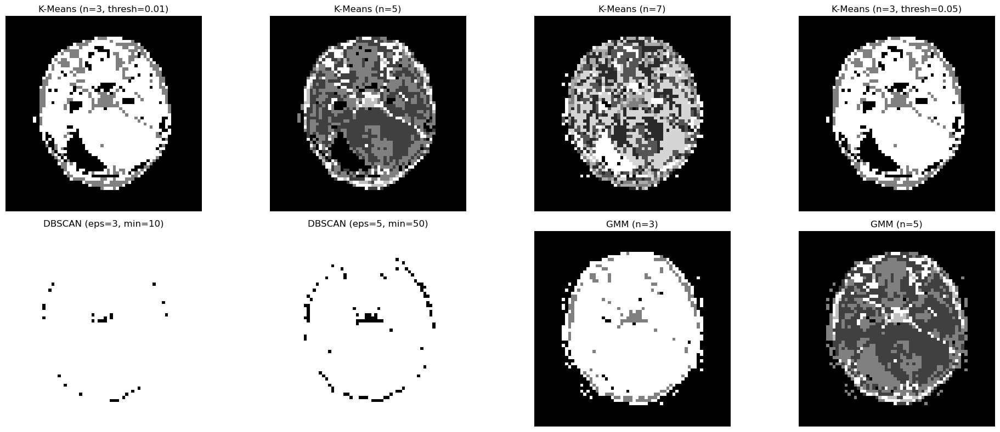


Updated Comparison Table:
                        Method  Accuracy
7  RF (anomaly_threshold=0.05)    0.8612
6        RF (n_estimators=200)    0.8589
4                          GMM    0.8574
0       K-Means (n_clusters=3)    0.8520
5        RF (n_estimators=100)    0.8520
1       K-Means (n_clusters=5)    0.8040
2       K-Means (n_clusters=7)    0.7796
3                       DBSCAN    0.7269


In [25]:
import matplotlib.pyplot as plt

sample_image = test_images[0]
pixels = sample_image.reshape(64 * 64, 1)

plt.figure(figsize=(20, 8))

labels_km3 = KMeans(n_clusters=3, random_state=277).fit_predict(pixels)
plt.subplot(2, 4, 1)
plt.imshow(labels_km3.reshape(64, 64), cmap="gray")
plt.title("K-Means (n=3, thresh=0.01)")
plt.axis("off")

labels_km5 = KMeans(n_clusters=5, random_state=277).fit_predict(pixels)
plt.subplot(2, 4, 2)
plt.imshow(labels_km5.reshape(64, 64), cmap="gray")
plt.title("K-Means (n=5)")
plt.axis("off")

labels_km7 = KMeans(n_clusters=7, random_state=277).fit_predict(pixels)
plt.subplot(2, 4, 3)
plt.imshow(labels_km7.reshape(64, 64), cmap="gray")
plt.title("K-Means (n=7)")
plt.axis("off")

kmeans_005 = KMeans(n_clusters=3, random_state=277)
labels_km005 = kmeans_005.fit_predict(pixels)
counts = np.bincount(labels_km005, minlength=3)
small_clusters = counts < (0.05 * 4096)
labels_km005_small = np.where(small_clusters[labels_km005], -1, labels_km005)
plt.subplot(2, 4, 4)
plt.imshow(labels_km005_small.reshape(64, 64), cmap="gray")
plt.title("K-Means (n=3, thresh=0.05)")
plt.axis("off")

labels_db3 = DBSCAN(eps=3, min_samples=10).fit_predict(pixels)
plt.subplot(2, 4, 5)
plt.imshow(labels_db3.reshape(64, 64), cmap="gray")
plt.title("DBSCAN (eps=3, min=10)")
plt.axis("off")

labels_db5 = DBSCAN(eps=5, min_samples=50).fit_predict(pixels)
plt.subplot(2, 4, 6)
plt.imshow(labels_db5.reshape(64, 64), cmap="gray")
plt.title("DBSCAN (eps=5, min=50)")
plt.axis("off")

labels_gmm = GaussianMixture(n_components=3, random_state=277).fit_predict(pixels)
plt.subplot(2, 4, 7)
plt.imshow(labels_gmm.reshape(64, 64), cmap="gray")
plt.title("GMM (n=3)")
plt.axis("off")

labels_gmm5 = GaussianMixture(n_components=5, random_state=277).fit_predict(pixels)
plt.subplot(2, 4, 8)
plt.imshow(labels_gmm5.reshape(64, 64), cmap="gray")
plt.title("GMM (n=5)")
plt.axis("off")

plt.tight_layout()
plt.show()

import pandas as pd
methods = [
    "K-Means (n_clusters=3)", 
    "K-Means (n_clusters=5)", 
    "K-Means (n_clusters=7)", 
    "DBSCAN", 
    "GMM", 
    "RF (n_estimators=100)", 
    "RF (n_estimators=200)", 
    "RF (anomaly_threshold=0.05)"
]
accuracies = [
    accuracy_3, 
    accuracy_5, 
    accuracy_7, 
    accuracy_db, 
    accuracy_gmm, 
    accuracy_100, 
    accuracy_200, 
    accuracy_005
]
results_df = pd.DataFrame({
    "Method": methods,
    "Accuracy": accuracies
})
results_df["Accuracy"] = results_df["Accuracy"].round(4)
results_df = results_df.sort_values(by="Accuracy", ascending=False)
print("\nUpdated Comparison Table:")
print(results_df)